In [105]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [106]:
train_df=pd.read_csv("./fashion-mnist_train.csv")
test_df=pd.read_csv("./fashion-mnist_test.csv")
train_df.shape #first column - label data - ten classes, so from 0 to 9, remaining column - pixel data, each row, different image

(60000, 785)

Describing dataset

In [107]:
#checking for missing values
missing=train_df.isnull().sum().sum()
print(f'Number of missing values: {missing}')

Number of missing values: 0


In [108]:
print(f'Number of unique labels: {train_df["label"].nunique()}')

Number of unique labels: 10


In [109]:
label_dict={
    0: 'T-shirt/top',
    1: 'Trouser',
    2: 'Pullover',
    3: 'Dress',
    4: 'Coat',
    5: 'Sandal',
    6: 'Shirt',
    7: 'Sneaker',
    8: 'Bag',
    9: 'Ankle boot'
}

In [110]:
l_tr=train_df["label"].map(label_dict)
l_te=test_df["label"].map(label_dict)

In [111]:
label_counts=l_tr.value_counts()
print(label_counts)

label
Pullover       6000
Ankle boot     6000
Shirt          6000
T-shirt/top    6000
Dress          6000
Coat           6000
Sandal         6000
Bag            6000
Sneaker        6000
Trouser        6000
Name: count, dtype: int64


In [112]:
l_tr.head()

0       Pullover
1     Ankle boot
2          Shirt
3    T-shirt/top
4          Dress
Name: label, dtype: object

In [113]:
l_tr.describe()

count        60000
unique          10
top       Pullover
freq          6000
Name: label, dtype: object

In [114]:
l_tr.info()

<class 'pandas.core.series.Series'>
RangeIndex: 60000 entries, 0 to 59999
Series name: label
Non-Null Count  Dtype 
--------------  ----- 
60000 non-null  object
dtypes: object(1)
memory usage: 468.9+ KB


In [115]:
pixels_train=train_df.drop(['label'], axis=1)
labels_train=train_df['label']
pixels_test=test_df.drop(['label'], axis=1)
labels_test=test_df['label']

In [116]:
#normalisation
pixels_train=pixels_train/255.0
pixels_test=pixels_test/255.0

In [117]:
train_images=pixels_train.values.reshape(-1,28,28,1) 
test_images=pixels_test.values.reshape(-1,28,28,1)

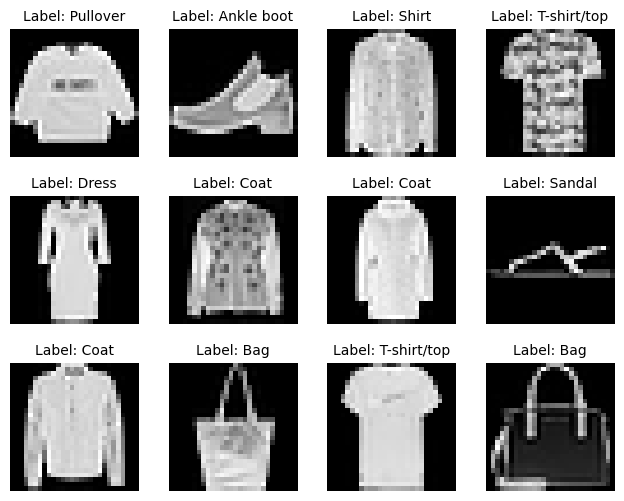

In [118]:
num_images=12
columns=4 
rows=num_images//columns+(num_images%columns>0)  
indices=np.linspace(0, 20, 20, dtype=int)
fig, axes=plt.subplots(rows, columns, figsize=(columns*2, rows*2), dpi=100)
for i, ax in enumerate(axes.flat):
    if i<num_images: 
        index=indices[i]
        image=train_images[index].reshape(28, 28)  
        label=l_tr.iloc[index]
        ax.imshow(image, cmap='gray')
        ax.set_title(f"Label: {label}", fontsize=10)
        ax.axis('off')  
    else:
        ax.axis('off')  
plt.subplots_adjust(wspace=0.1, hspace=0.3)  
plt.show()

Taking a sample of original data

In [119]:
from sklearn.model_selection import train_test_split
pixels_train, _, labels_train, _=train_test_split(pixels_train, labels_train, test_size=0.80, stratify=labels_train, random_state=42)
_, pixels_test, _, labels_test=train_test_split(pixels_test, labels_test, test_size=0.2, stratify=labels_test,random_state=42)

In [120]:
train_images=pixels_train.values.reshape(-1,28,28,1)

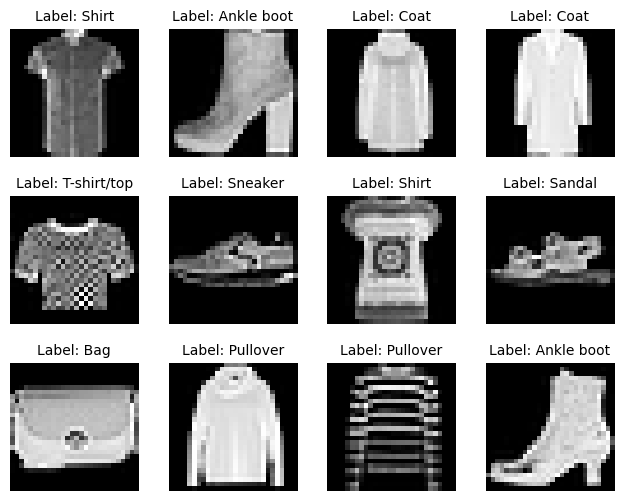

In [121]:
fig, axes=plt.subplots(rows, columns, figsize=(columns*2, rows*2), dpi=100)
for i, ax in enumerate(axes.flat):
    if i<num_images: 
        index=indices[i]
        image=train_images[index].reshape(28, 28)  
        label=labels_train.map(label_dict).iloc[index]
        ax.imshow(image, cmap='gray')
        ax.set_title(f"Label: {label}", fontsize=10)
        ax.axis('off')  
    else:
        ax.axis('off')  
plt.subplots_adjust(wspace=0.1, hspace=0.3)  
plt.show()

Data dimensions reduction

In [122]:
from sklearn.decomposition import PCA
pca_method=PCA()
pca_results=pca_method.fit_transform(pixels_train)
cumulative_explained_variance_pca=np.cumsum(pca_method.explained_variance_ratio_)
n_pca=np.where(cumulative_explained_variance_pca>=0.95)[0][0]+1
print(f'Number of components needed to explain 95% of the variance: {n_pca}')

Number of components needed to explain 95% of the variance: 184


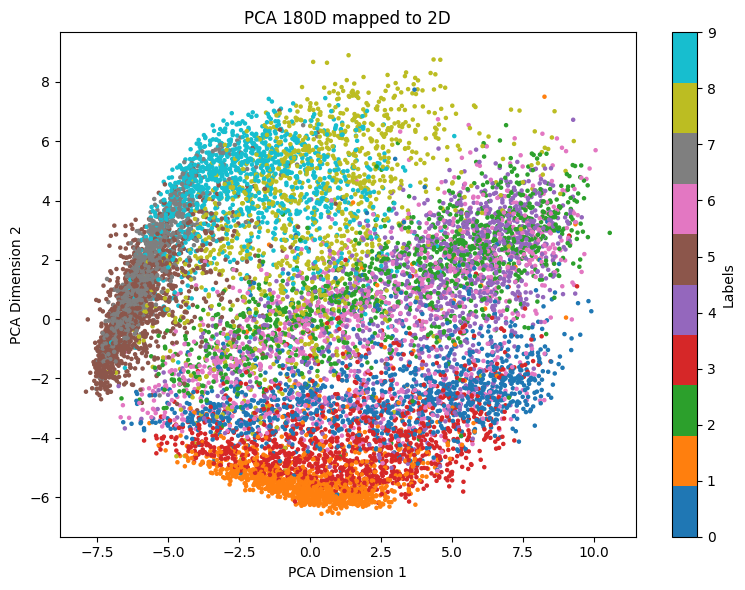

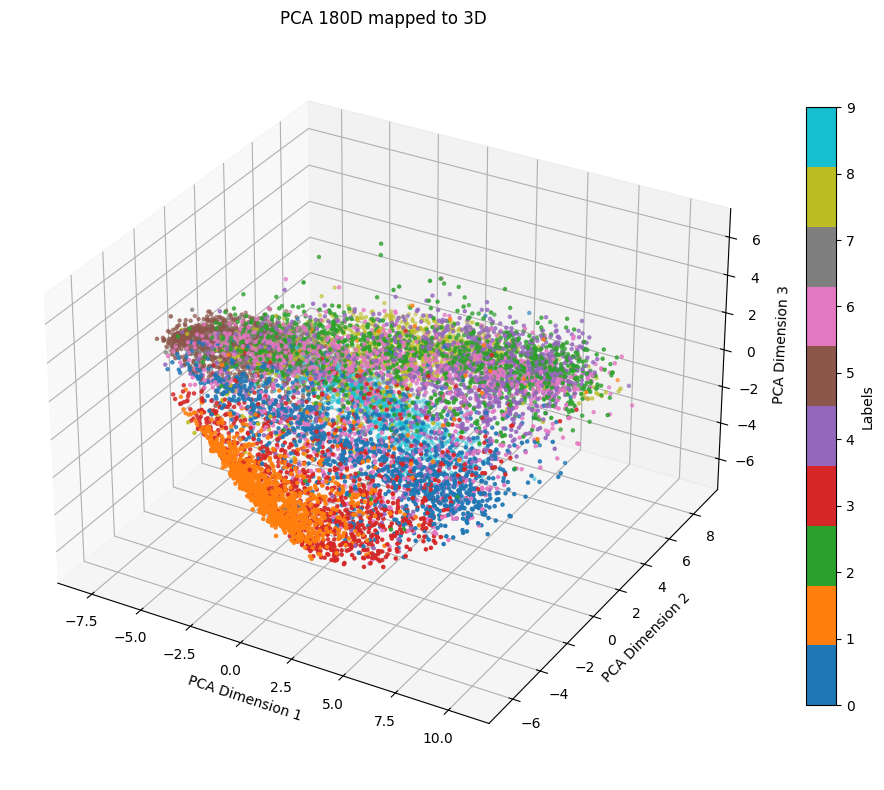

In [123]:
fig1, ax1=plt.subplots(figsize=(8, 6))
scatter1=ax1.scatter(pca_results[:, 0], pca_results[:, 1], c=labels_train, cmap='tab10', s=5)
cbar1=fig1.colorbar(scatter1, ax=ax1)
cbar1.set_label("Labels")
ax1.set_title("PCA 180D mapped to 2D")
ax1.set_xlabel("PCA Dimension 1")
ax1.set_ylabel("PCA Dimension 2")
plt.tight_layout()
plt.show()

fig2=plt.figure(figsize=(10, 8))
ax2=fig2.add_subplot(111, projection='3d')
ax2.set_box_aspect([1.5, 1.5, 1]) 
scatter2=ax2.scatter(pca_results[:, 0], pca_results[:, 1], pca_results[:, 2], c=labels_train, cmap='tab10', s=5)
cbar2=fig2.colorbar(scatter2, ax=ax2, shrink=0.8)
cbar2.set_label("Labels")
ax2.set_title("PCA 180D mapped to 3D")
ax2.set_xlabel("PCA Dimension 1")
ax2.set_ylabel("PCA Dimension 2")
ax2.set_zlabel("PCA Dimension 3")
plt.tight_layout()
plt.show()

In [124]:
pca_method=PCA(n_components=n_pca)
pca_results=pca_method.fit_transform(pixels_train)
pca_results.shape

(12000, 184)

In [125]:
pca_method_2d=PCA(n_components=2)
pca_results_2d=pca_method_2d.fit_transform(pixels_train)
accuracy2d=np.sum(pca_method_2d.explained_variance_ratio_)
print(f'Explained variance: {accuracy2d}')

Explained variance: 0.4670978800368578


In [126]:
pca_method_3d=PCA(n_components=3)
pca_results_3d=pca_method_3d.fit_transform(pixels_train)
accuracy3d=np.sum(pca_method_3d.explained_variance_ratio_)
print(f'Explained variance: {accuracy3d}')

Explained variance: 0.5280267796759279


In [127]:
from sklearn.manifold import TSNE
tsne_method_3d=TSNE(n_components=3, perplexity=50, max_iter=int(600), learning_rate=1000, method='barnes_hut')
tsne_results_3d=tsne_method_3d.fit_transform(pixels_train)
print("t-SNE finished. Results shape:", tsne_results_3d.shape)

t-SNE finished. Results shape: (12000, 3)


In [128]:
from sklearn.manifold import TSNE
tsne_method_2d=TSNE(n_components=2, perplexity=50, max_iter=int(600), learning_rate=1000, method='barnes_hut')
tsne_results_2d=tsne_method_2d.fit_transform(pixels_train)
print("t-SNE finished. Results shape:", tsne_results_2d.shape)

t-SNE finished. Results shape: (12000, 2)


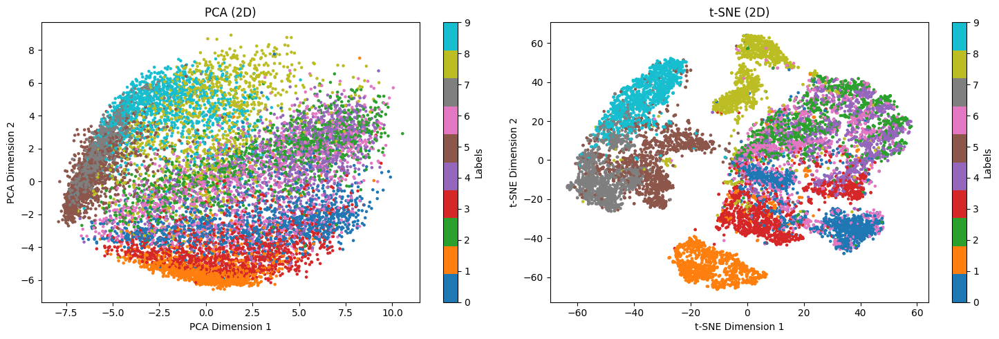

In [129]:
fig, axs=plt.subplots(1, 2, figsize=(15, 5))
scatter1=axs[0].scatter(pca_results_2d[:, 0], pca_results_2d[:, 1], c=labels_train, cmap='tab10', s=5)
cbar1=fig.colorbar(scatter1, ax=axs[0])
cbar1.set_label("Labels")
axs[0].set_title("PCA (2D)")
axs[0].set_xlabel("PCA Dimension 1")
axs[0].set_ylabel("PCA Dimension 2")
scatter2=axs[1].scatter(tsne_results_2d[:, 0], tsne_results_2d[:, 1], c=labels_train, cmap='tab10', s=5)
cbar2=fig.colorbar(scatter2, ax=axs[1]) 
cbar2.set_label("Labels")
axs[1].set_title("t-SNE (2D)")
axs[1].set_xlabel("t-SNE Dimension 1")
axs[1].set_ylabel("t-SNE Dimension 2")
plt.tight_layout()
plt.show()

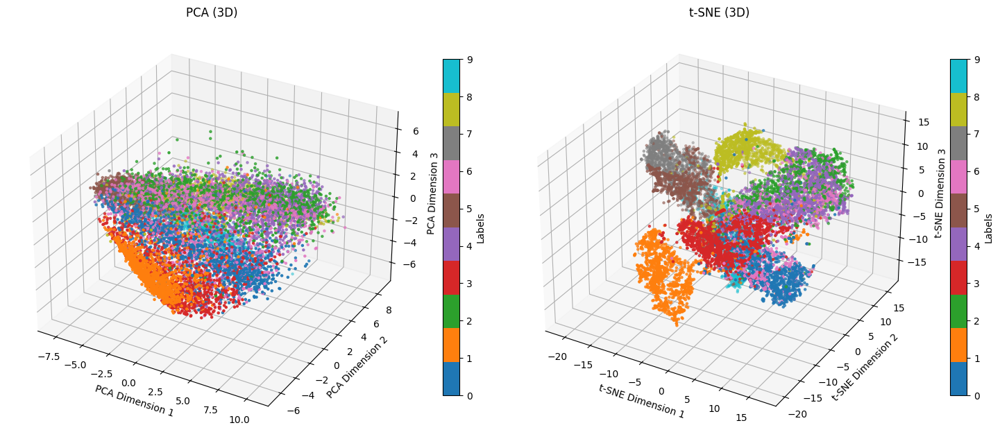

In [130]:
fig=plt.figure(figsize=(15, 10))
ax1=fig.add_subplot(1, 2, 1, projection='3d')
scatter1=ax1.scatter(pca_results_3d[:, 0], pca_results_3d[:, 1], pca_results_3d[:, 2], c=labels_train, cmap='tab10', s=5)
cbar1=fig.colorbar(scatter1, ax=ax1, shrink=0.5)
cbar1.set_label("Labels")
ax1.set_title("PCA (3D)")
ax1.set_xlabel("PCA Dimension 1")
ax1.set_ylabel("PCA Dimension 2")
ax1.set_zlabel("PCA Dimension 3")
ax2=fig.add_subplot(1, 2, 2, projection='3d')
scatter2=ax2.scatter(tsne_results_3d[:, 0], tsne_results_3d[:, 1], tsne_results_3d[:, 2], c=labels_train, cmap='tab10', s=5)
cbar2=fig.colorbar(scatter2, ax=ax2, shrink=0.5)
cbar2.set_label("Labels")
ax2.set_title("t-SNE (3D)")
ax2.set_xlabel("t-SNE Dimension 1")
ax2.set_ylabel("t-SNE Dimension 2")
ax2.set_zlabel("t-SNE Dimension 3")
plt.tight_layout()
plt.show()


Agglomerative clustering

In [131]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.metrics import silhouette_score
import random
import sys

In [132]:
#function for finding the best parameters for agglomerative clustering - for every number of cluster different linkage methods are applied and then the silhouette score is calculated. Based on that the best 4 models are chosen. Arguments flag_3d enable user to choose types of plots to show, 0-only 2d, 1-only 3d, 2-both 2 and 3d, when flag_plots enable or disable ploting overall, 1-not plotting, every other number-plot
def evaluate_agglomerative(data, linkage_methods, n_clusters_range, flag_3d=0, flag_plots=1,  centroids=None):
    #assesing each combination of parameters
    results=[]
    for n_clusters in n_clusters_range:
        for method in linkage_methods:
            clustering=AgglomerativeClustering(n_clusters=n_clusters, linkage=method)
            labels=clustering.fit_predict(data)
            silhouette=silhouette_score(data, labels)
            results.append((silhouette, method, n_clusters, labels))
    #sorting the results and taking 4 highest scores
    top_results=sorted(results, key=lambda x: x[0], reverse=True)[:4]
    print("\nTop 4 Results:")
    for silhouette, method, n_clusters, _ in top_results:
        print(f"Linkage: {method}, Clusters: {n_clusters}, Silhouette Score: {silhouette:.4f}")
    #opctional dendogram and plot plotting
    if flag_plots!=1:
        subset_indices=random.sample(range(data.shape[0]), min(100, data.shape[0]))
        data_subset=data[subset_indices]
        plot_dendrograms(data_subset, top_results[:2])
        if flag_3d in [0, 2]:
            plot_clusters_2d(data, top_results[1][3], None, top_results[0][3],
                             title1=f"{top_results[0][1].upper()} 2D Clustering ({top_results[0][2]} clusters)",
                             title2=f"{top_results[1][1].upper()} 2D Clustering ({top_results[1][2]} clusters)")
        if flag_3d in [1, 2]:
            plot_clusters_3d(data, top_results[1][3], None, top_results[0][3], title1=f"{top_results[0][1].upper()} 3D Clustering ({top_results[0][2]} clusters)", title2=f"{top_results[1][1].upper()} 3D Clustering ({top_results[1][2]} clusters)")

In [133]:
#function for dendogram plotting
def plot_dendrograms(data, top_results):
    if len(top_results)<2:
        print("Insufficient results to plot two best dendrograms.")
        return
    fig, axes=plt.subplots(1, 2, figsize=(15, 5))
    for idx, (silhouette, method, n_clusters, _) in enumerate(top_results[:2]):
        linked=linkage(data, method=method)
        cut_height=linked[-(n_clusters - 1), 2]
        dendrogram(linked, ax=axes[idx], color_threshold=cut_height, no_labels=True)
        axes[idx].axhline(y=cut_height, color='red', linestyle='--', label=f'Cut for {n_clusters} clusters')
        axes[idx].set_title(f"Dendrogram ({method.upper()} Linkage, {n_clusters} Clusters)")
        axes[idx].set_xlabel("Sample Index")
        axes[idx].set_ylabel("Distance")
        axes[idx].legend()
    plt.tight_layout()
    plt.show()

In [134]:
#2d plot plotting function with optional centroids
def plot_clusters_2d(data, clusters, centroids, labels_true, title1, title2):
    cluster_colors=plt.cm.tab10(np.linspace(0, 1, len(np.unique(clusters))))
    darker_cluster_colors=[adjust_lightness(color, 1.5) for color in cluster_colors]

    fig, axes=plt.subplots(1, 2, figsize=(15, 5))
    axes[0].scatter(data[:, 0], data[:, 1], c=labels_true, cmap="tab10")
    axes[0].set_title(title1)
    axes[0].set_xlabel("Component 1")
    axes[0].set_ylabel("Component 2")
    for cluster_idx, color in enumerate(cluster_colors):
        cluster_points=data[clusters==cluster_idx]
        axes[1].scatter(cluster_points[:, 0], cluster_points[:, 1], c=[color], label=f"Cluster {cluster_idx+1}")
        if centroids is not None:
            centroid=centroids[cluster_idx]
            axes[1].scatter(centroid[0], centroid[1], s=300, color=darker_cluster_colors[cluster_idx], marker='X', edgecolor='black', linewidth=2)
    axes[1].set_title(title2)
    axes[1].set_xlabel("Component 1")
    axes[1].set_ylabel("Component 2")
    axes[1].legend()

    plt.tight_layout()
    plt.show()


In [135]:
#3d plotting function with optional centroids
def plot_clusters_3d(data, clusters, centroids, labels_true, title1, title2):
    cluster_colors=plt.cm.tab10(np.linspace(0, 1, len(np.unique(clusters))))
    fig=plt.figure(figsize=(18, 7))
    ax1=fig.add_subplot(121, projection='3d')
    ax2=fig.add_subplot(122, projection='3d')
    ax1.scatter(data[:, 0], data[:, 1], data[:, 2], c=labels_true, cmap="tab10")
    ax1.set_title(title1)
    ax1.set_xlabel("Component 1")
    ax1.set_ylabel("Component 2")
    ax1.set_zlabel("Component 3")
    for cluster_idx, color in enumerate(cluster_colors):
        cluster_points=data[clusters == cluster_idx]
        ax2.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], c=[color], label=f"Cluster {cluster_idx+1}")
        if centroids is not None:
            centroid=centroids[cluster_idx]
            ax2.scatter(centroid[0], centroid[1], centroid[2], s=300, color=color, marker='X', edgecolor='black', linewidth=2)
    ax2.set_title(title2)
    ax2.set_xlabel("Component 1")
    ax2.set_ylabel("Component 2")
    ax2.set_zlabel("Component 3")
    ax2.legend()
    plt.tight_layout()
    plt.show()

In [136]:
#function to adjust centroid's markers colors
def adjust_lightness(color, amount=0.5):
    import matplotlib.colors as mc
    import colorsys
    try:
        c=mc.cnames[color]
    except:
        c=color
    c=colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], max(0, min(1, amount*c[1])), c[2])

In [137]:
#changing this parameter not co call a warning
sys.setrecursionlimit(10000)    
#setting parameters
linkage_methods=['ward', 'complete', 'average', 'single']
n_clusters_range=range(3, 11)

Evaluating agglomerative clustering on bunch of differently reduced data


Top 4 Results:
Linkage: ward, Clusters: 4, Silhouette Score: 0.1829
Linkage: ward, Clusters: 3, Silhouette Score: 0.1775
Linkage: single, Clusters: 3, Silhouette Score: 0.1672
Linkage: average, Clusters: 10, Silhouette Score: 0.1611


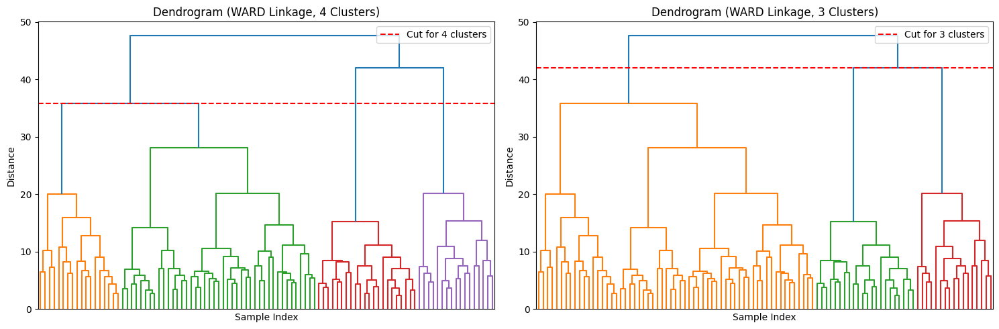

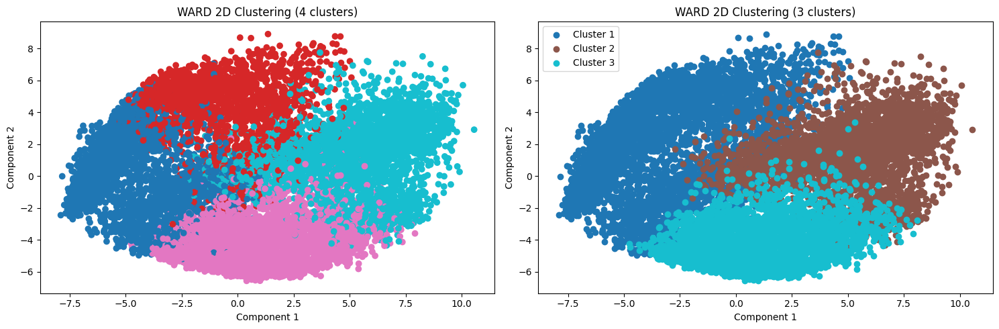

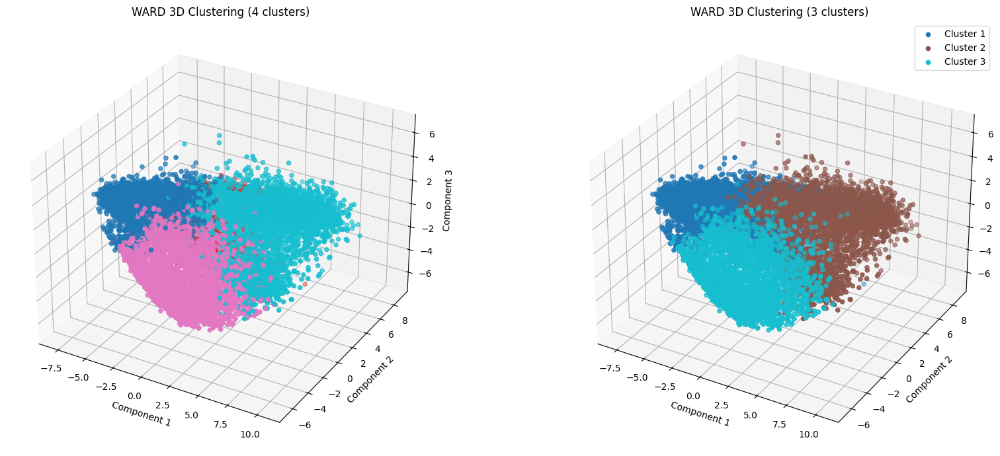

In [138]:
evaluate_agglomerative(pca_results, linkage_methods, n_clusters_range, 2, 2)


Top 4 Results:
Linkage: average, Clusters: 3, Silhouette Score: 0.4400
Linkage: ward, Clusters: 8, Silhouette Score: 0.4294
Linkage: average, Clusters: 7, Silhouette Score: 0.4281
Linkage: ward, Clusters: 9, Silhouette Score: 0.4240


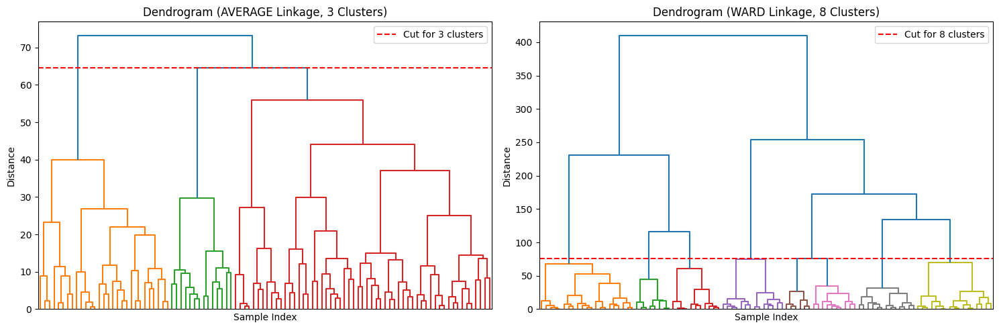

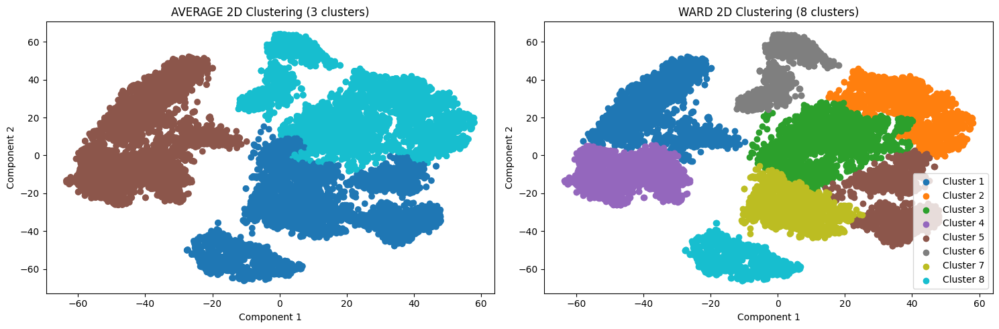

In [139]:
evaluate_agglomerative(tsne_results_2d, linkage_methods, n_clusters_range, 0, 2)

In [140]:
evaluate_agglomerative(pca_results_2d, linkage_methods, n_clusters_range, 0, 1)


Top 4 Results:
Linkage: complete, Clusters: 4, Silhouette Score: 0.4090
Linkage: ward, Clusters: 4, Silhouette Score: 0.4051
Linkage: complete, Clusters: 3, Silhouette Score: 0.4006
Linkage: average, Clusters: 4, Silhouette Score: 0.3994


In [141]:
evaluate_agglomerative(pca_results_3d, linkage_methods, n_clusters_range, 0, 1)


Top 4 Results:
Linkage: ward, Clusters: 4, Silhouette Score: 0.3810
Linkage: ward, Clusters: 3, Silhouette Score: 0.3792
Linkage: average, Clusters: 3, Silhouette Score: 0.3726
Linkage: average, Clusters: 4, Silhouette Score: 0.3599


In [142]:
evaluate_agglomerative(tsne_results_3d, linkage_methods, n_clusters_range, 1, 1)


Top 4 Results:
Linkage: complete, Clusters: 10, Silhouette Score: 0.3648
Linkage: average, Clusters: 9, Silhouette Score: 0.3644
Linkage: ward, Clusters: 6, Silhouette Score: 0.3641
Linkage: average, Clusters: 10, Silhouette Score: 0.3583


Evaluation of 10 clusters agglomerative


Top 4 Results:
Linkage: average, Clusters: 10, Silhouette Score: 0.1611
Linkage: complete, Clusters: 10, Silhouette Score: 0.1272
Linkage: ward, Clusters: 10, Silhouette Score: 0.1255
Linkage: single, Clusters: 10, Silhouette Score: -0.0153


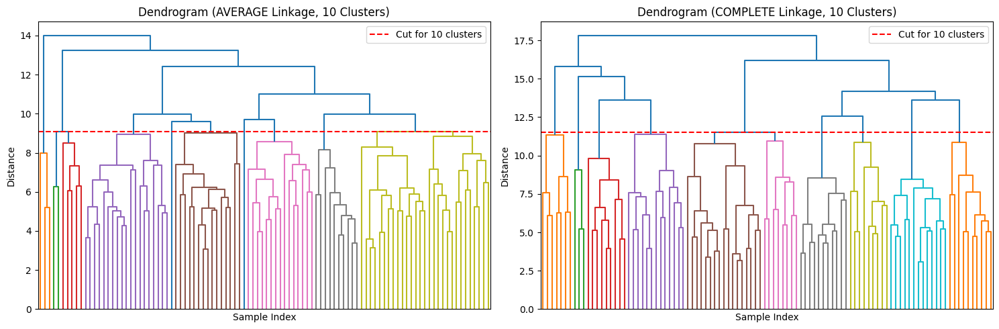

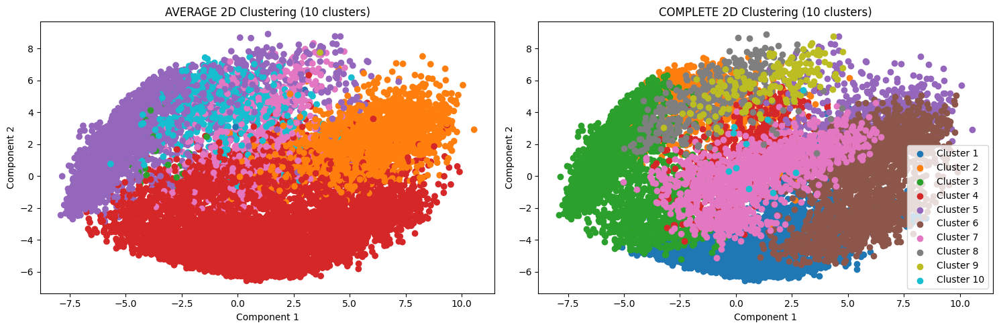

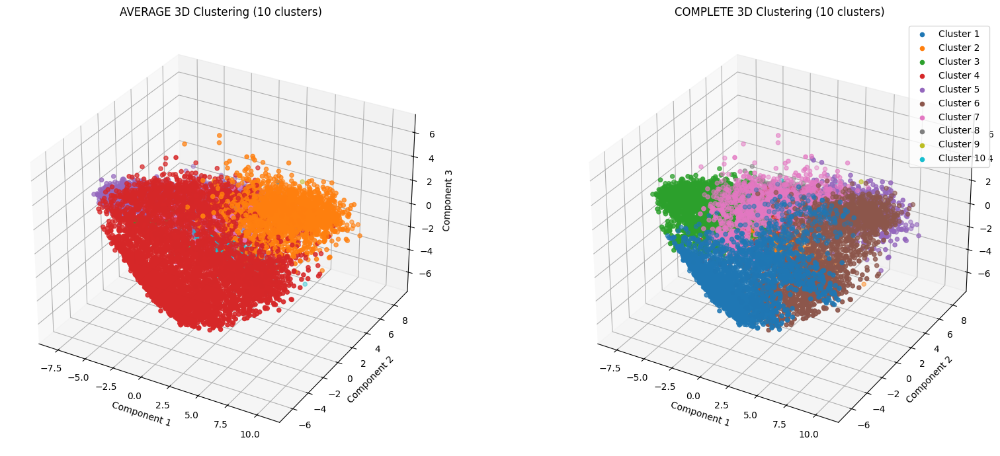

In [143]:
evaluate_agglomerative(pca_results, linkage_methods, [10], 2, 2)


Top 4 Results:
Linkage: ward, Clusters: 10, Silhouette Score: 0.4134
Linkage: average, Clusters: 10, Silhouette Score: 0.4034
Linkage: complete, Clusters: 10, Silhouette Score: 0.3649
Linkage: single, Clusters: 10, Silhouette Score: -0.4411


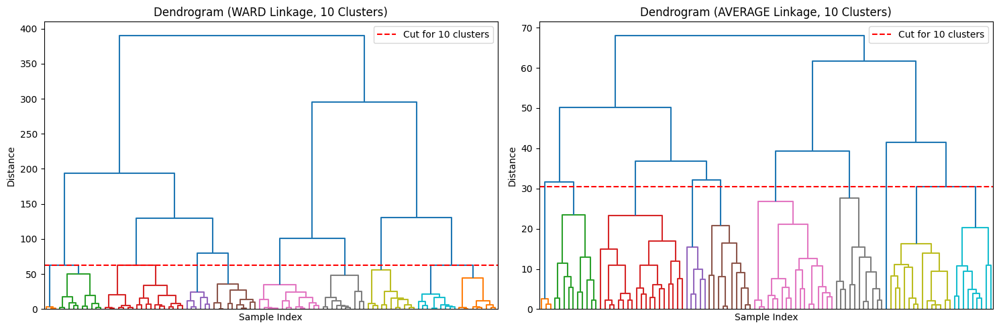

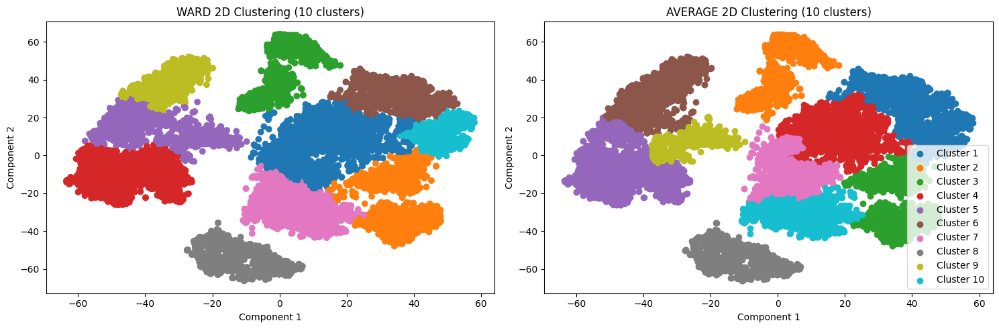

In [144]:
evaluate_agglomerative(tsne_results_2d, linkage_methods, [10] ,0, 2)

KMeans clustering

In [170]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, adjusted_rand_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

# Normalize metrics for fair comparison during evaluation
def normalize_metrics(results_df):
    metrics=['silhouette', 'davies_bouldin', 'calinski_harabasz', 'ari']
    normalized_results=results_df.copy()
    scaler=MinMaxScaler()
    for metric in metrics:
        if metric=='davies_bouldin':  #davies-bouldin needs inverted for comparison
            normalized_results[metric]=1-scaler.fit_transform(results_df[[metric]])
        else:
            normalized_results[metric]=scaler.fit_transform(results_df[[metric]])
    return normalized_results

In [171]:
#function to evaluate kmeans models and chosing best ones. The exact approach taken is described in a raport
def evaluate_kmeans(results_df, majority_threshold=3, top_n=5):
    normalized_results=normalize_metrics(results_df)
    #ranking normalised results
    rankings={}
    for metric in ['silhouette', 'davies_bouldin', 'calinski_harabasz', 'ari']:
        rankings[metric]=normalized_results[metric].rank(ascending=(metric!='davies_bouldin'))
    #checking dominance
    results_df['dominates_in']=normalized_results[['silhouette', 'davies_bouldin', 'calinski_harabasz', 'ari']].apply(lambda row: sum(row.rank() <= majority_threshold),axis=1)
    #computing total score based on means of normalised results
    results_df['total_score']=normalized_results[['silhouette', 'davies_bouldin', 'calinski_harabasz', 'ari']].mean(axis=1)
    #selecting top models with accurate dominance
    majority_models=results_df[results_df['dominates_in']>=majority_threshold]
    top_models=majority_models.sort_values(by='total_score', ascending=False).head(top_n)
    
    return top_models

In [172]:
def evaluate_kmeans_nclusters(n_clusters, data_2d, data_3d, labels_true, method_name):
    #calculate scores for 2d data
    result_2d=compute_metrics(data_2d, labels_true, n_clusters, method_name)
    print(f"{method_name.upper()} - Fixed Clusters ({n_clusters}):")
    print(f"2D Metrics:")
    print(f"  ARI: {result_2d['ari']:.4f}, Silhouette: {result_2d['silhouette']:.4f}, Davies-Bouldin: {result_2d['davies_bouldin']:.4f}, Calinski-Harabasz: {result_2d['calinski_harabasz']:.4f}")
    # ploting 2d clusters
    plot_clusters_2d(data_2d, result_2d['clusters'], result_2d['centroids'], labels_true, f"{method_name.upper()} 2D", f"K-means for {method_name.upper()} 2D ({n_clusters} Clusters)")
    #calculate scores for 3d data
    result_3d=compute_metrics(data_3d, labels_true, n_clusters, method_name)
    print(f"3D Metrics:")
    print(f"  ARI: {result_3d['ari']:.4f}, Silhouette: {result_3d['silhouette']:.4f}, Davies-Bouldin: {result_3d['davies_bouldin']:.4f}, Calinski-Harabasz: {result_3d['calinski_harabasz']:.4f}")
    #plotting 3d clusters
    plot_clusters_3d(data_3d, result_3d['clusters'], result_3d['centroids'], labels_true, f"{method_name.upper()} 3D", f"K-means for {method_name.upper()} 3D ({n_clusters} Clusters)")


In [173]:
# computing models and metrics
def compute_metrics(data, labels_true, n_clusters, method_name):
    kmeans=KMeans(n_clusters=n_clusters, random_state=42)
    clusters=kmeans.fit_predict(data)
    return {'n_clusters': n_clusters, 'method': method_name, 'ari': adjusted_rand_score(labels_true, clusters), 'silhouette': silhouette_score(data, clusters), 'davies_bouldin': davies_bouldin_score(data, clusters), 'calinski_harabasz': calinski_harabasz_score(data, clusters), 'centroids': kmeans.cluster_centers_, 'clusters': clusters}

In [201]:
#Parameters for kmeans evaluation
cluster_range=range(2, 11)
results=[]
methods=[('pca', pca_results_2d), ('tsne', tsne_results_2d), ('pca_180', pca_results), ('pca3d', pca_results_3d),('tsne3d', tsne_results_3d)]

for n_clusters in cluster_range:
    for method_name, data in methods:
        result=compute_metrics(data, labels_train, n_clusters, method_name)
        results.append(result)
results_df=pd.DataFrame(results)
results_df=results_df.drop(columns=['centroids', 'clusters'], errors='ignore')
#evaluation
top_40_hybrid=evaluate_kmeans(results_df, majority_threshold=3, top_n=40)

In [200]:
print("\nTop 40 Models (Evaluation based on normalized metrics):")
print(top_40_hybrid[['method', 'n_clusters', 'silhouette', 'davies_bouldin', 'calinski_harabasz', 'ari', 'total_score']].head(40))

     method  n_clusters  silhouette  davies_bouldin  calinski_harabasz  \
41     tsne          10    0.432642        0.800216       15854.161345   
36     tsne           9    0.438085        0.795880       15394.176358   
31     tsne           8    0.436036        0.791101       14359.584775   
21     tsne           6    0.411539        0.838016       13058.133885   
16     tsne           5    0.423415        0.806638       12916.459961   
30      pca           8    0.428744        0.733460       15136.749010   
20      pca           6    0.446887        0.740077       14131.344796   
25      pca           7    0.427490        0.733243       14269.065274   
35      pca           9    0.413739        0.752926       14999.427696   
11     tsne           4    0.428449        0.777369       12039.637416   
10      pca           4    0.444272        0.747574       13692.878247   
40      pca          10    0.401208        0.777182       14961.645288   
6      tsne           3    0.449487   

Plotting best models in each method 2d

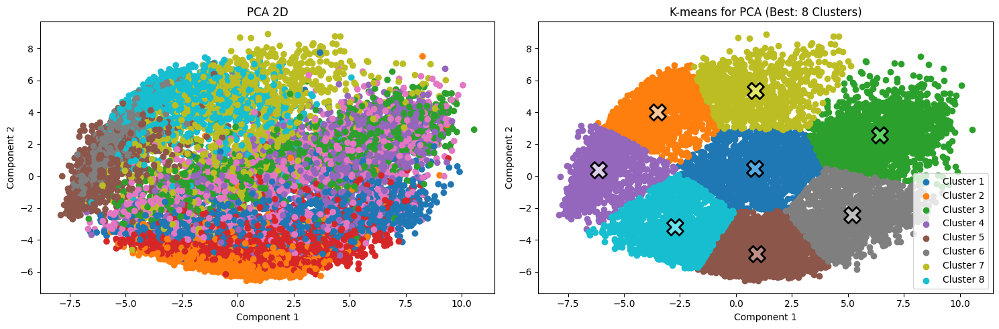

In [175]:
best_model_pca=top_40_hybrid[top_40_hybrid['method']=='pca'].iloc[0]
best_n_clusters=int(best_model_pca['n_clusters'])

pca_kmeans=compute_metrics(pca_results_2d, labels_train, best_n_clusters, 'pca')
plot_clusters_2d(pca_results_2d, pca_kmeans['clusters'], pca_kmeans['centroids'], labels_train, f"PCA 2D", f"K-means for PCA (Best: {best_n_clusters} Clusters)")

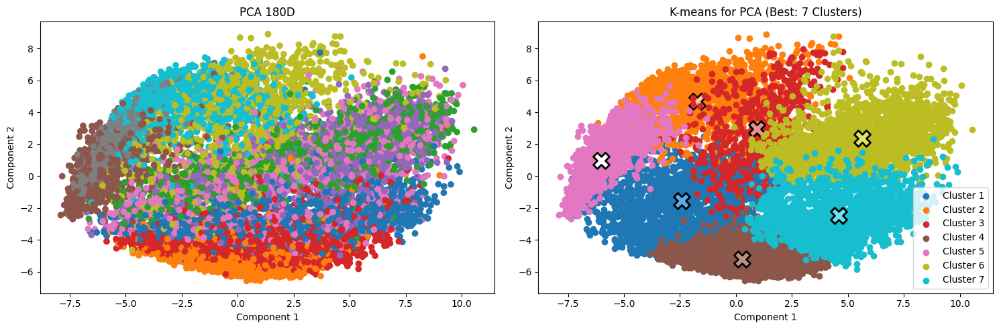

In [176]:
best_model_pca=top_40_hybrid[top_40_hybrid['method']=='pca_180'].iloc[0]
best_n_clusters=int(best_model_pca['n_clusters'])

pca_kmeans=compute_metrics(pca_results, labels_train, best_n_clusters, 'pca_180')
plot_clusters_2d(pca_results, pca_kmeans['clusters'], pca_kmeans['centroids'], labels_train, f"PCA 180D", f"K-means for PCA (Best: {best_n_clusters} Clusters)")

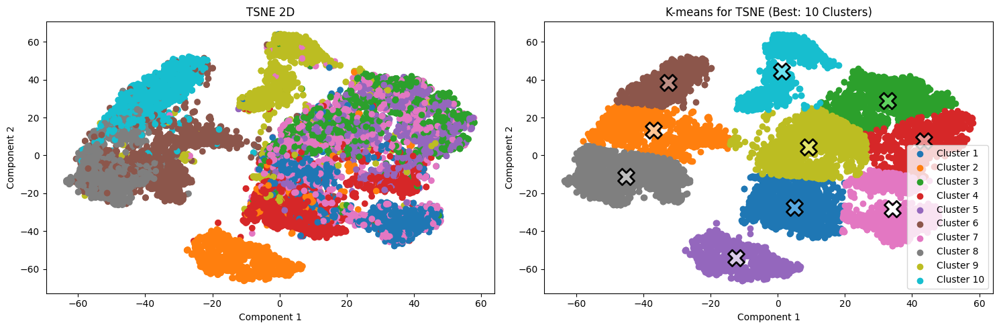

In [177]:
best_model_tsne=top_40_hybrid[top_40_hybrid['method']=='tsne'].iloc[0]
best_n_clusters_tsne=int(best_model_tsne['n_clusters'])

tsne_kmeans=compute_metrics(tsne_results_2d, labels_train, best_n_clusters_tsne, 'tsne')
plot_clusters_2d(tsne_results_2d, tsne_kmeans['clusters'], tsne_kmeans['centroids'], labels_train, f"TSNE 2D", f"K-means for TSNE (Best: {best_n_clusters_tsne} Clusters)")

Plotting clustering results on 3d

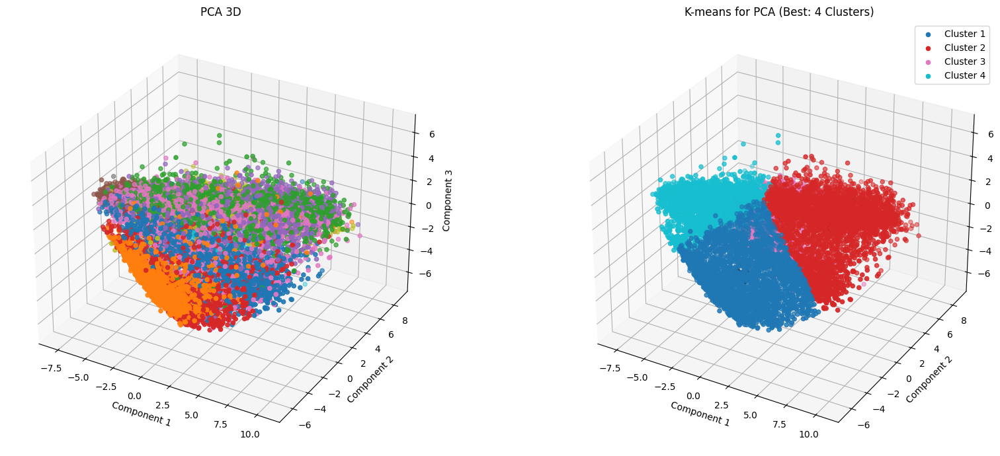

In [183]:
best_model_pca3d=top_40_hybrid[top_40_hybrid['method']=='pca3d'].iloc[0]
best_n_clusters=int(best_model_pca3d['n_clusters'])

pca3d_kmeans=compute_metrics(pca_results_3d, labels_train, best_n_clusters, 'pca')
plot_clusters_3d(pca_results_3d, pca3d_kmeans['clusters'], pca3d_kmeans['centroids'], labels_train, f"PCA 3D", f"K-means for PCA (Best: {best_n_clusters} Clusters)")

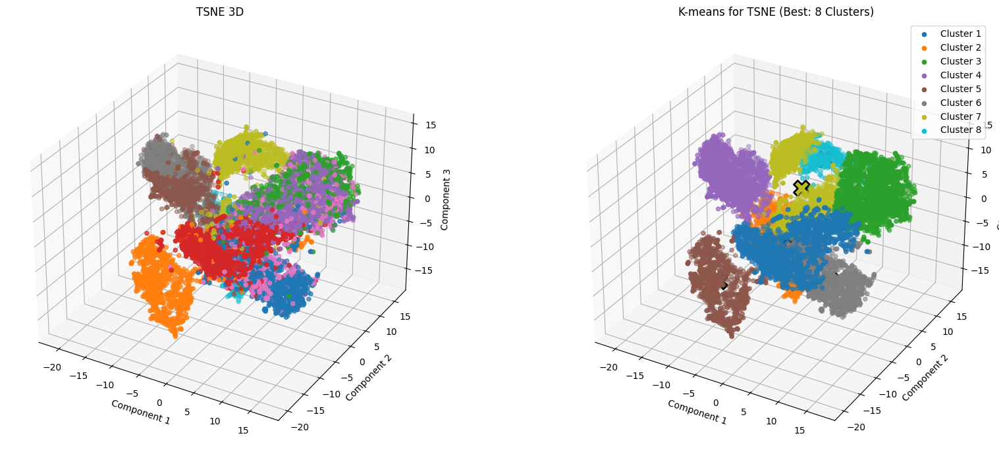

In [184]:
best_model_tsne3d=top_40_hybrid[top_40_hybrid['method']=='tsne3d'].iloc[0]
best_n_clusters_tsne3d=int(best_model_tsne3d['n_clusters'])

tsne3d_kmeans=compute_metrics(tsne_results_3d, labels_train, best_n_clusters_tsne3d, 'tsne')
plot_clusters_3d(tsne_results_3d, tsne3d_kmeans['clusters'], tsne3d_kmeans['centroids'], labels_train, f"TSNE 3D", f"K-means for TSNE (Best: {best_n_clusters_tsne3d} Clusters)")

Evaluating and plotting kmeans on fixed numbers of clusters

PCA_180 - Fixed Clusters (10):
2D Metrics:
  ARI: 0.3403, Silhouette: 0.1436, Davies-Bouldin: 1.8729, Calinski-Harabasz: 1670.8870


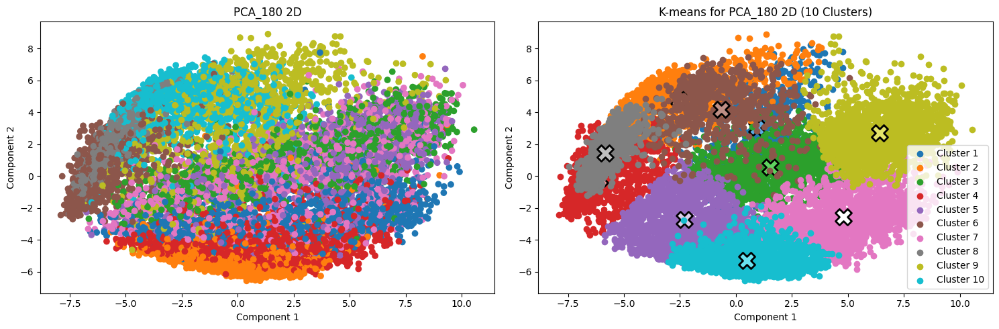

3D Metrics:
  ARI: 0.3403, Silhouette: 0.1436, Davies-Bouldin: 1.8729, Calinski-Harabasz: 1670.8870


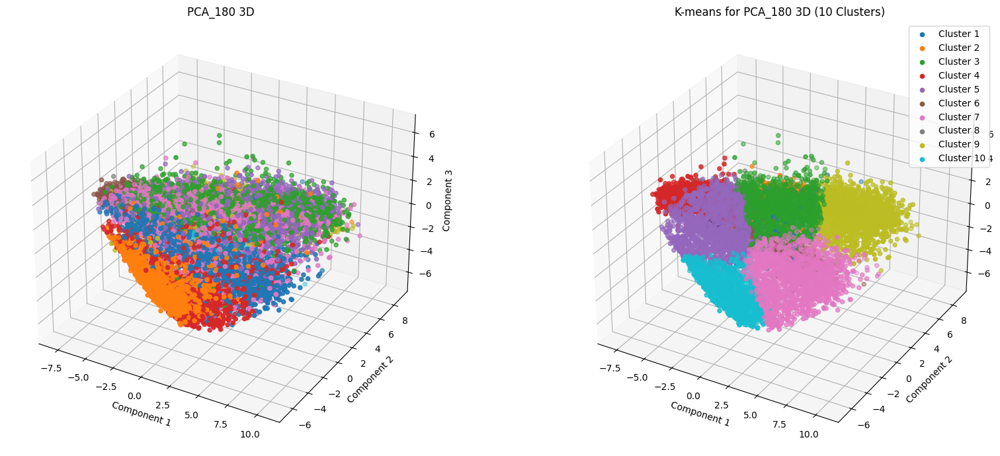

In [191]:
evaluate_kmeans_nclusters(10, pca_results, pca_results, labels_train, 'pca_180')

TSNE - Fixed Clusters (10):
2D Metrics:
  ARI: 0.4266, Silhouette: 0.4326, Davies-Bouldin: 0.8002, Calinski-Harabasz: 15854.1613


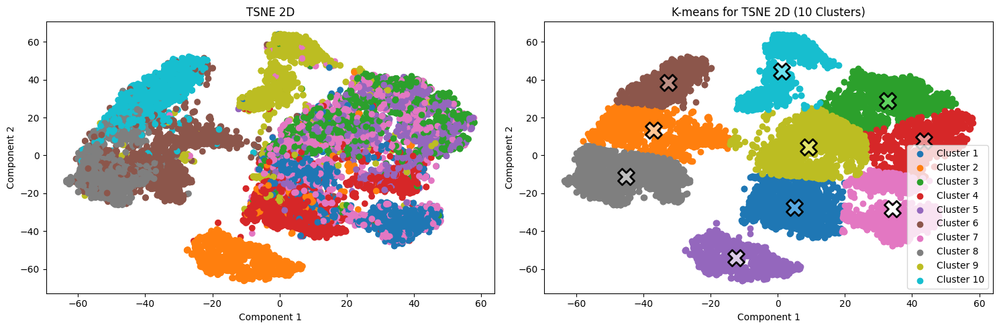

3D Metrics:
  ARI: 0.4389, Silhouette: 0.3687, Davies-Bouldin: 0.9597, Calinski-Harabasz: 7398.6141


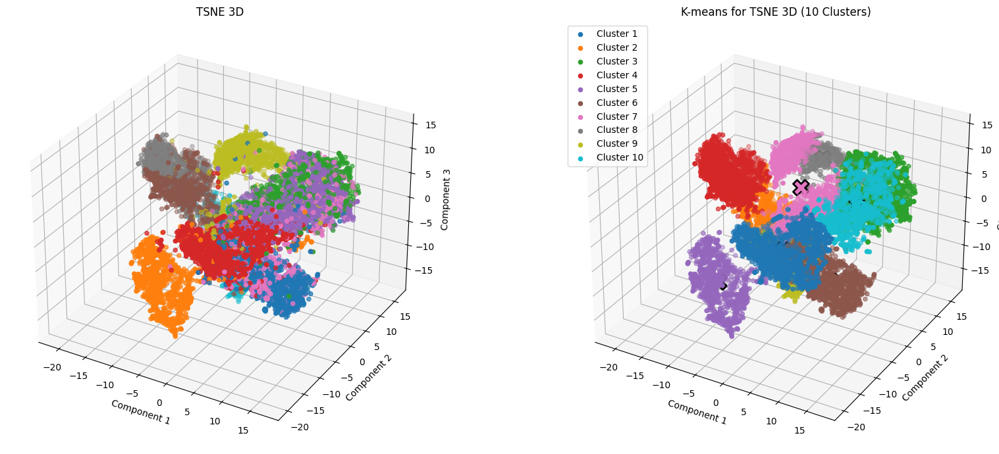

In [192]:
evaluate_kmeans_nclusters(10, tsne_results_2d, tsne_results_3d, labels_train, 'tsne')

DBSCAN clustering

In [161]:
from sklearn.cluster import DBSCAN
#fuction to search for best parameters to make clusters between 3 and 10
def grid_search_dbscan(X, eps_values, min_samples_values):
    best_score=-1
    best_ari=0
    best_params={}
    #loop in a loop to check all possible combinations
    for eps in eps_values:
        for min_samples in min_samples_values:
            model=DBSCAN(eps=eps, min_samples=min_samples)
            labels=model.fit_predict(X)
            n_clusters=len(set(labels))-(1 if -1 in labels else 0)
            #computing scores only for clusters within given range
            if 3 <= n_clusters <= 10:
                if len(set(labels))>1:
                    score=silhouette_score(X, labels)
                    ari=adjusted_rand_score(labels_train, labels)
                    if score>best_score:
                        best_score=score
                        best_ari=ari
                        best_params={'eps': eps, 'min_samples': min_samples}
    print(f"Best parameters: {best_params}, Silhouette Score: {best_score:.4f}, ARI: {best_ari:.4f}")
    return best_params

In [162]:
#choosing parameters ranges
eps_values=np.linspace(1.5, 3.5, 200)
min_samples_values=range(50, 100, 1)
best_params_2d=grid_search_dbscan(tsne_results_2d, eps_values, min_samples_values)

Best parameters: {'eps': 3.5, 'min_samples': 58}, Silhouette Score: 0.3566, ARI: 0.4233


Fitting the best model

In [167]:
best_model=DBSCAN(eps=best_params_2d['eps'], min_samples=best_params_2d['min_samples'])
clusters_tsne_best=best_model.fit_predict(tsne_results_2d)
best_n_clusters=len(set(clusters_tsne_best))-(1 if -1 in clusters_tsne_best else 0)
outliers=tsne_results_2d[clusters_tsne_best==-1]
num_outliers=len(outliers)

Plotting results

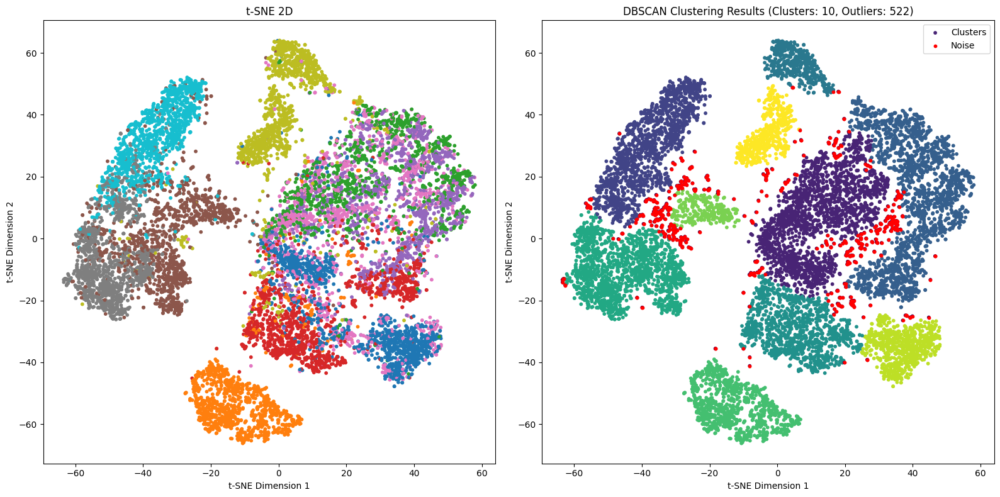

In [168]:
fig, axs=plt.subplots(1, 2, figsize=(16, 8))
axs[0].scatter(tsne_results_2d[:, 0], tsne_results_2d[:, 1],c=labels_train, cmap="tab10", s=10)
axs[0].set_title(f"t-SNE 2D")
axs[0].set_xlabel("t-SNE Dimension 1")
axs[0].set_ylabel("t-SNE Dimension 2")
axs[1].scatter(tsne_results_2d[:, 0], tsne_results_2d[:, 1], c=clusters_tsne_best, cmap='viridis', s=10, label="Clusters")
axs[1].scatter(outliers[:, 0], outliers[:, 1], c='red', s=10, label="Noise")
axs[1].set_title(f"DBSCAN Clustering Results (Clusters: {best_n_clusters}, Outliers: {num_outliers})")
axs[1].set_xlabel("t-SNE Dimension 1")
axs[1].set_ylabel("t-SNE Dimension 2")
axs[1].legend()
plt.tight_layout()
plt.show()

Plotting outliers images

Number of outliers (noise points): 522


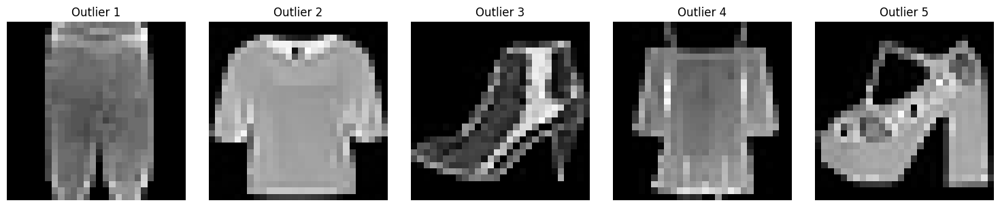

In [169]:
if num_outliers>0:
    print(f"Number of outliers (noise points): {num_outliers}")
    outlier_indices=np.where(clusters_tsne_best==-1)[0]
    num_visualized_outliers=min(5, num_outliers)
    selected_outlier_indices=outlier_indices[:num_visualized_outliers]

    fig, axes=plt.subplots(1, num_visualized_outliers, figsize=(15, 3))
    for i, ax in enumerate(axes):
        ax.imshow(pixels_train.iloc[selected_outlier_indices[i]].values.reshape(28, 28), cmap='gray')
        ax.axis('off')
        ax.set_title(f"Outlier {i+1}")
    plt.tight_layout()
    plt.show()
else:
    print("No outliers detected.")

Classification

In [243]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
from sklearn.tree import DecisionTreeClassifier, plot_tree

In [238]:
#function for clasification evaluation
def evaluate_model(model_type, params, pixels_train, labels_train, pixels_test, labels_test, label_dict=None, top_n=2):
    results = []
    #choosing model
    for param in params:
        if model_type=='knn':
            model=KNeighborsClassifier(n_neighbors=param['k'], metric=param['metric'])
        elif model_type=='tree':
            model=DecisionTreeClassifier(max_depth=int(param))
        labels_pred=cross_val_predict(model, pixels_train, labels_train, cv=5)
        accuracy=accuracy_score(labels_train, labels_pred)
        precision=precision_score(labels_train, labels_pred, average='weighted', zero_division=0)
        recall=recall_score(labels_train, labels_pred, average='weighted', zero_division=0)
        if model_type == 'knn':
            results.append({'param': param, 'accuracy': accuracy, 'precision': precision, 'recall': recall})
        elif model_type == 'tree':
            results.append({'param': param, 'accuracy': accuracy, 'precision': precision, 'recall': recall})
    results_df=pd.DataFrame(results)
    
    #rank results
    for metric in ['accuracy', 'precision', 'recall']:
        results_df[f'rank_{metric}']=results_df[metric].rank(ascending=False)
    #checking dominance
    results_df['dominates_in']=results_df[['rank_accuracy', 'rank_precision', 'rank_recall']].apply(lambda row: sum(row<=2), axis=1)
    #calculating total score
    results_df['total_score']=results_df[['accuracy', 'precision', 'recall']].mean(axis=1)
    #chosing best models
    top_models=results_df.sort_values(by='total_score', ascending=False).head(top_n)
    print(top_models)
    
    # Plot confusion matrices
    plot_cm(top_models, model_type, pixels_train, labels_train, pixels_test, labels_test)
    # For KNN: Plot mismatches
    if model_type=='knn':
        plot_mismatches(top_models.iloc[0], model_type, pixels_train, labels_train, pixels_test, labels_test, label_dict)
    
    # For Decision Trees: Plot mismatches and tree structure
    elif model_type=='tree':
        plot_mismatches(top_models.iloc[0], model_type, pixels_train, labels_train, pixels_test, labels_test, label_dict)
        plot_decision_tree(top_models.iloc[0], pixels_train, labels_train)
    
    return top_models


In [239]:
#function for plotting confusion metrices
def plot_cm(top_models, model_type, pixels_train, labels_train, pixels_test, labels_test):
    fig, axes=plt.subplots(1, len(top_models), figsize=(12, 6))
    axes=axes.ravel()

    for i, (_,row) in enumerate(top_models.iterrows()):
        if model_type=='knn':
            model=KNeighborsClassifier(n_neighbors=row['param']['k'], metric=row['param']['metric'])
        elif model_type=='tree':
            model=DecisionTreeClassifier(max_depth=int(row['param']))
        model.fit(pixels_train, labels_train)
        labels_pred=model.predict(pixels_test)
        cm=confusion_matrix(labels_test, labels_pred)
    
        ax=axes[i]
        ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.7)
        for (j, k), val in np.ndenumerate(cm):
            ax.text(k, j, f'{val}', ha='center', va='center')
        ax.set_title(f"Param={row['param']}")
        ax.set_xlabel('Predicted')
        ax.set_ylabel('True')
    plt.tight_layout()
    plt.show()

In [240]:
#function for ploting mismatches
def plot_mismatches(top_model, model_type, pixels_train, labels_train, pixels_test, labels_test, label_dict, max_mismatches=16):
    if model_type=='knn':
        model=KNeighborsClassifier(n_neighbors=top_model['param']['k'], metric=top_model['param']['metric'])
    elif model_type=='tree':
        model=DecisionTreeClassifier(max_depth=int(top_model['param']))
    model.fit(pixels_train, labels_train)
    labels_pred=model.predict(pixels_test)
    mismatches=np.where(labels_test!=labels_pred)[0]
    print(f"Mismatches: {len(mismatches)}")
    if len(mismatches)>0:
        fig, axes=plt.subplots(4, 4, figsize=(12, 12))
        axes=axes.ravel()
        
        for i, idx in enumerate(mismatches[:max_mismatches]):
            pixel_data=pixels_test.iloc[idx].to_numpy() if isinstance(pixels_test, pd.DataFrame) else pixels_test[idx]
            axes[i].imshow(pixel_data.reshape(28, 28), cmap='gray')
            axes[i].set_title(f"True: {labels_test.map(label_dict).iloc[idx]}\nPred: {label_dict[labels_pred[idx]]}")
            axes[i].axis('off')
        plt.tight_layout()
        plt.show()

In [241]:
#functions for plotting decision trees
def plot_decision_tree(top_model, pixels_train, labels_train):
    model=DecisionTreeClassifier(max_depth=int(top_model['param']))
    model.fit(pixels_train, labels_train)
    plt.figure(figsize=(18, 12))
    plot_tree(model, filled=True)
    plt.title(f"Decision Tree (Depth={int(top_model['param'])})")
    plt.show()

                              param  accuracy  precision    recall  \
22  {'k': 8, 'metric': 'manhattan'}  0.831583   0.832315  0.831583   
10  {'k': 4, 'metric': 'manhattan'}  0.831667   0.831940  0.831667   

    rank_accuracy  rank_precision  rank_recall  dominates_in  total_score  
22            2.0             1.0          2.0             3     0.831827  
10            1.0             4.0          1.0             2     0.831758  


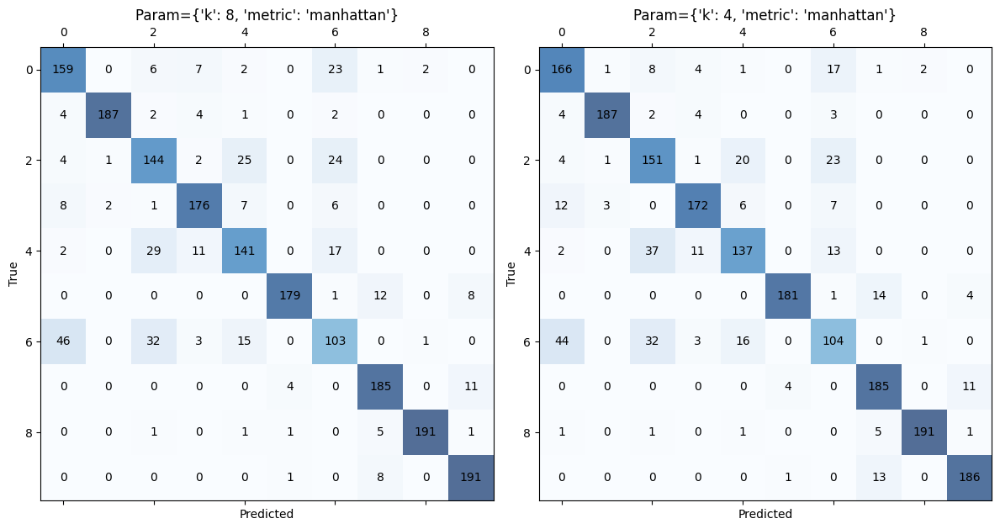

Mismatches: 344


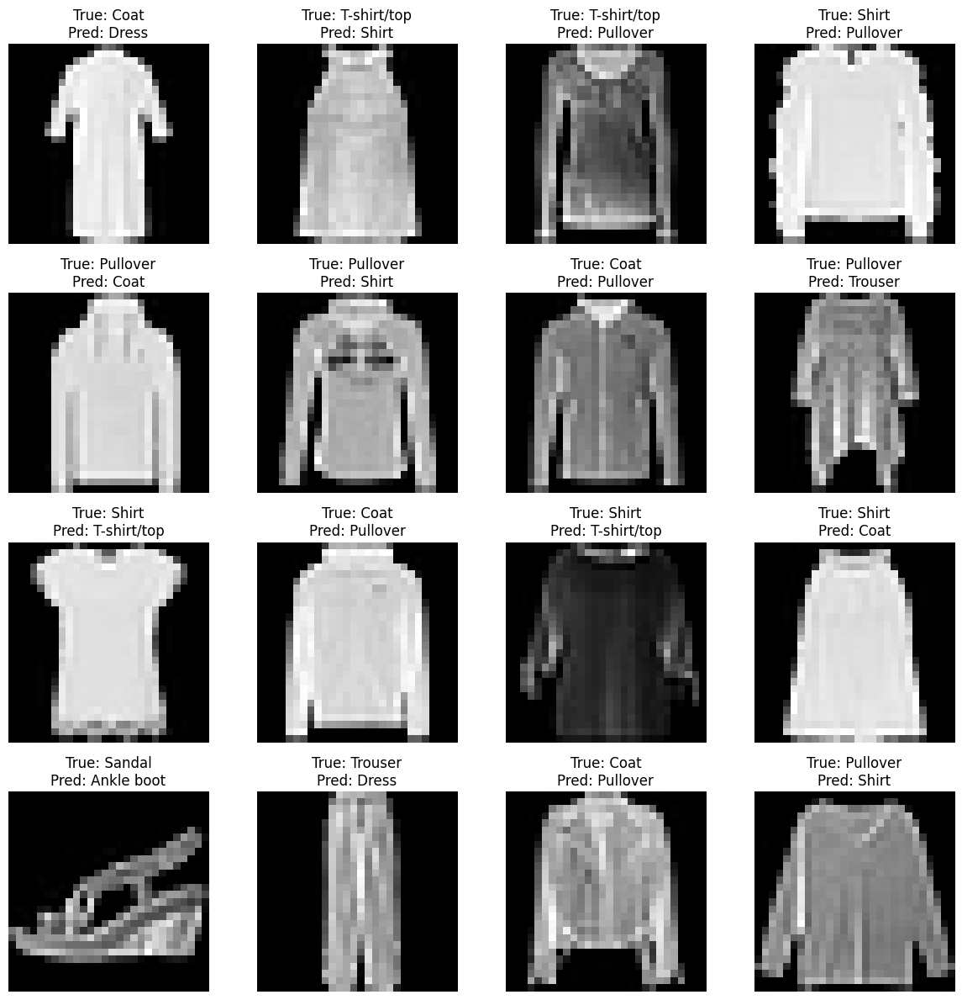

In [232]:
knn_params=[{'k': k, 'metric': metric} for k in range(1, 21) for metric in ['euclidean', 'manhattan', 'cosine']]
top_knn_models=evaluate_model('knn', knn_params, pixels_train, labels_train, pixels_test, labels_test, label_dict)

   param  accuracy  precision    recall  rank_accuracy  rank_precision  \
8     10  0.767917   0.768918  0.767917            1.0             1.0   
7      9  0.767500   0.768401  0.767500            2.0             2.0   

   rank_recall  dominates_in  total_score  
8          1.0             3     0.768251  
7          2.0             3     0.767800  


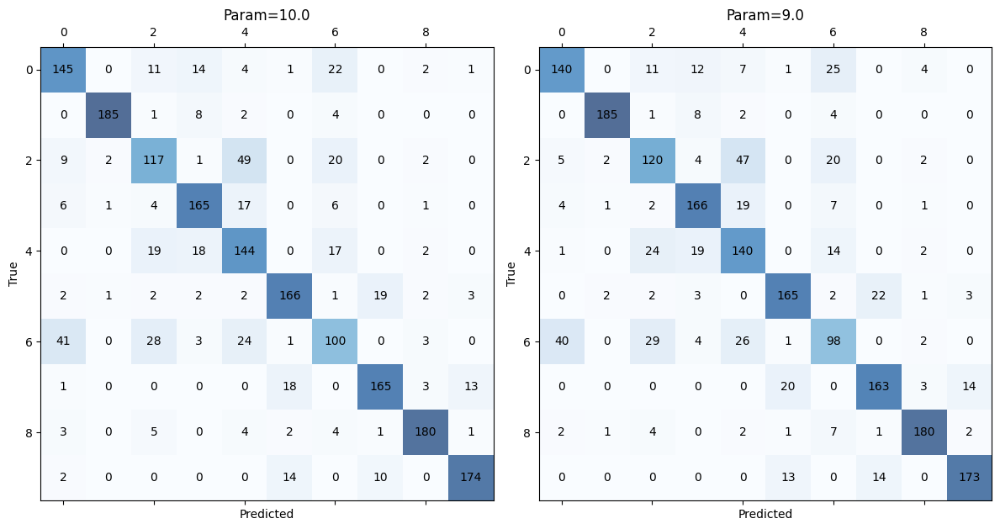

Mismatches: 469


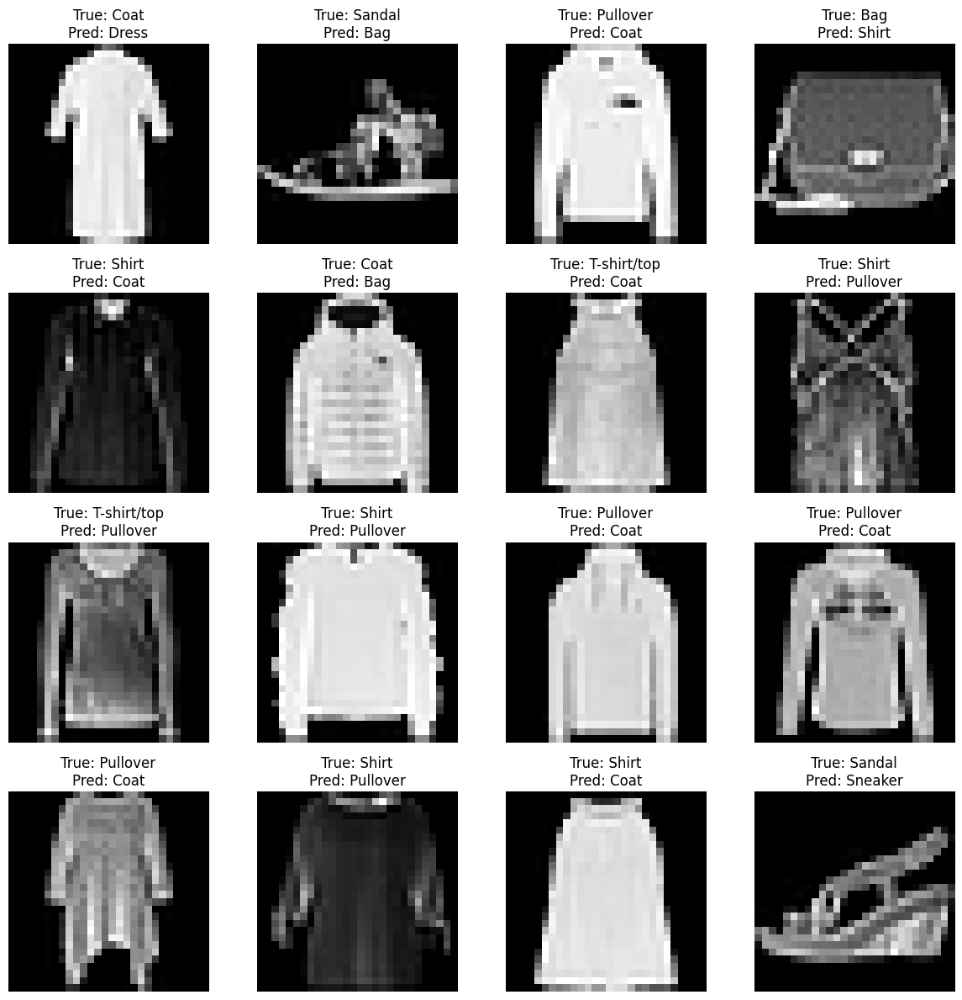

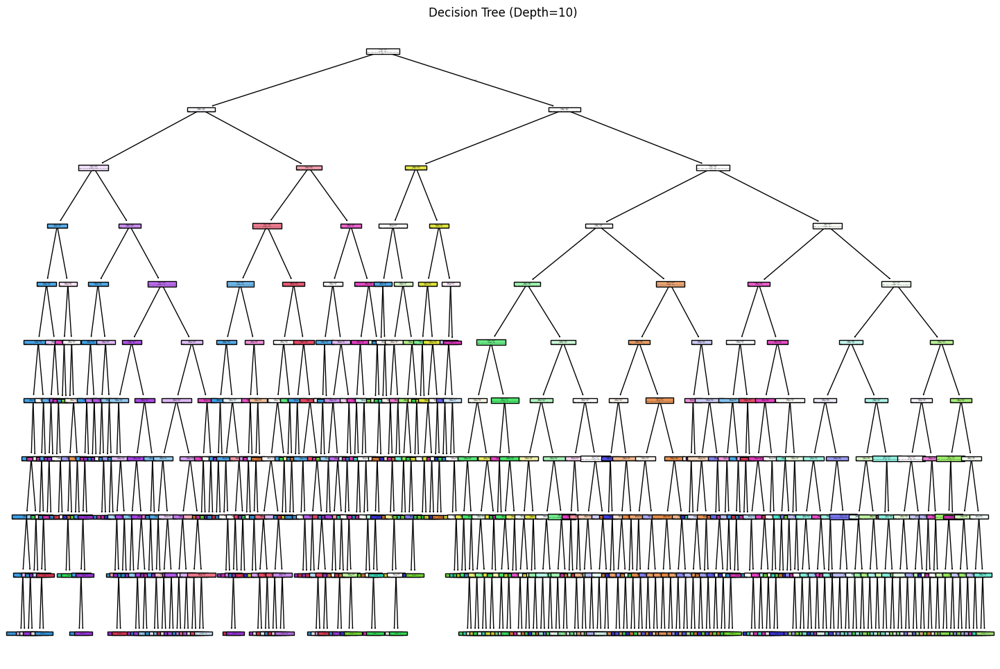

In [242]:
tree_depths=range(2, 11)
top_tree_models=evaluate_model('tree', tree_depths, pixels_train, labels_train, pixels_test, labels_test, label_dict)